In [3]:
# Conexão com o Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import cv2
import numpy as np
from google.colab import drive
from datetime import timedelta

# Montar Google Drive
drive.mount('/content/drive')

# Função para converter o horário de início (HH:MM:SS) em segundos
def time_to_seconds(hour, minute, second):
    return hour * 3600 + minute * 60 + second

# Função para converter segundos em hh:mm:ss
def seconds_to_hhmmss(seconds):
    return str(timedelta(seconds=seconds))

# Função para calcular os intervalos dos vídeos
def calcular_intervalos(videos):
    intervalos = []
    for key, video in videos.items():
        start = video['start']
        end = start + video['duration']
        intervalos.append((key, start, end))
    return intervalos

# Função para unir intervalos sobrepostos ou adjacentes
def unir_intervalos(intervalos):
    intervalos.sort(key=lambda x: x[1])  # Ordenar os intervalos pelo tempo de início
    intervalos_unidos = []

    _, start, end = intervalos[0]

    for key, next_start, next_end in intervalos[1:]:
        if next_start <= end:  # Se o próximo intervalo começar antes de o atual terminar
            end = max(end, next_end)  # Estender o final para cobrir a sobreposição
        else:
            intervalos_unidos.append((start, end))
            start, end = next_start, next_end

    intervalos_unidos.append((start, end))  # Adicionar o último intervalo

    return intervalos_unidos

def intervalo_comum(intervalo1, intervalo2):
    return max(intervalo1[0], intervalo2[0]), min(intervalo1[1], intervalo2[1])

# Informações dos vídeos
videos_colorido = {
    'colorido_1': {'path': '/content/drive/MyDrive/approach_nwot/DATA/08-08/00000000217000400.mp4', 'start': time_to_seconds(14, 8, 14), 'duration': time_to_seconds(0, 7, 10)},
    'colorido_2': {'path': '/content/drive/MyDrive/approach_nwot/DATA/08-08/00000000218000000.mp4', 'start': time_to_seconds(14, 15, 24), 'duration': time_to_seconds(1, 10, 18)},
    'colorido_3': {'path': '/content/drive/MyDrive/approach_nwot/DATA/08-08/00000000219000000.mp4', 'start': time_to_seconds(15, 25, 41), 'duration': time_to_seconds(0, 59, 10)},
}

videos_preto_branco = {
    'preto_branco_1': {'path': '/content/drive/MyDrive/approach_nwot/DATA/08-08/00000000220000000.mp4', 'start': time_to_seconds(16, 3, 35), 'duration': time_to_seconds(0, 21, 15)},
    'preto_branco_2': {'path': '/content/drive/MyDrive/approach_nwot/DATA/08-08/00000000215000500.mp4', 'start': time_to_seconds(14, 8, 14), 'duration': time_to_seconds(1, 55, 23)}
}

# Calcular intervalos de tempo para os vídeos coloridos e preto e branco
intervalos_colorido = calcular_intervalos(videos_colorido)
intervalos_preto_branco = calcular_intervalos(videos_preto_branco)

# Unir os intervalos de cada grupo de vídeos
intervalos_colorido_unidos = unir_intervalos(intervalos_colorido)
intervalos_preto_branco_unidos = unir_intervalos(intervalos_preto_branco)

print(f'intervalos_colorido: {intervalos_colorido} \n - hhmmss: {seconds_to_hhmmss(intervalos_colorido[0][1])} até {seconds_to_hhmmss(intervalos_colorido[0][2])} \n {seconds_to_hhmmss(intervalos_colorido[1][1])} até {seconds_to_hhmmss(intervalos_colorido[1][2])}  \n {seconds_to_hhmmss(intervalos_colorido[2][1])} até {seconds_to_hhmmss(intervalos_colorido[2][2])} ')
print(f'intervalos_preto_branco: {intervalos_preto_branco}  \n - hhmmss: {seconds_to_hhmmss(intervalos_preto_branco[0][1])} até {seconds_to_hhmmss(intervalos_preto_branco[0][2])} \n {seconds_to_hhmmss(intervalos_preto_branco[1][1])} até {seconds_to_hhmmss(intervalos_preto_branco[1][2])}')
print(f'intervalos_colorido_unidos: {intervalos_colorido_unidos} \n - hhmmss: {seconds_to_hhmmss(intervalos_colorido_unidos[0][0])} até {seconds_to_hhmmss(intervalos_colorido_unidos[0][1])}')
print(f'intervalos_preto_branco_unidos: {intervalos_preto_branco_unidos} \n - hhmmss: {seconds_to_hhmmss(intervalos_preto_branco_unidos[0][0])} até {seconds_to_hhmmss(intervalos_preto_branco_unidos[0][1])}')

intervalo_comum = intervalo_comum(intervalos_colorido_unidos[0], intervalos_preto_branco_unidos[0])
print(intervalo_comum)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
intervalos_colorido: [('colorido_1', 50894, 51324), ('colorido_2', 51324, 55542), ('colorido_3', 55541, 59091)] 
 - hhmmss: 14:08:14 até 14:15:24 
 14:15:24 até 15:25:42  
 15:25:41 até 16:24:51 
intervalos_preto_branco: [('preto_branco_2', 50894, 57817), ('preto_branco_1', 57815, 59090)]  
 - hhmmss: 14:08:14 até 16:03:37 
 16:03:35 até 16:24:50
intervalos_colorido_unidos: [(50894, 59091)] 
 - hhmmss: 14:08:14 até 16:24:51
intervalos_preto_branco_unidos: [(50894, 59090)] 
 - hhmmss: 14:08:14 até 16:24:50
(50894, 59090)


In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Função para reduzir FPS do vídeo colorido de 30 FPS para 25 FPS
def reduzir_fps_colorido(frames_colorido):
    frames_reduzidos_colorido = []

    # Para cada grupo de 30 frames, removemos os frames 6, 11, 16, 21 e 26
    for i in range(0, len(frames_colorido), 30):
        # Manter os frames 0 a 29 e remover os índices 6, 14, 20, 28
        frames_validos = [frame for j, frame in enumerate(frames_colorido[i:i+30]) if j not in [6, 14, 20, 28]]
        frames_reduzidos_colorido.extend(frames_validos)

    return frames_reduzidos_colorido

# Função para sobrepor dois frames (preto e branco sobre colorido)
def sobrepor_frames(frame_colorido, frame_preto_branco, x, y, opacidade, rotacao, resize_factor):
    # Redimensionar o frame preto e branco para o tamanho desejado (caso necessário)
    height_colorido, width_colorido = frame_colorido.shape[:2]

    # Aplicar resize no frame preto e branco
    if resize_factor != 1:
        frame_preto_branco = cv2.resize(frame_preto_branco, (int(frame_preto_branco.shape[1] * resize_factor), int(frame_preto_branco.shape[0] * resize_factor)))

    height_preto_branco, width_preto_branco = frame_preto_branco.shape[:2]

    # Rotacionar o frame preto e branco (se necessário)
    if rotacao != 0:
        M = cv2.getRotationMatrix2D((width_preto_branco // 2, height_preto_branco // 2), rotacao, 1)
        frame_preto_branco = cv2.warpAffine(frame_preto_branco, M, (width_preto_branco, height_preto_branco))

    # Criar uma área de overlay sobre o frame colorido
    overlay = np.zeros_like(frame_colorido)

    # Colocar o frame preto e branco na posição correta (x, y) no overlay
    y1, y2 = max(0, y), min(y + height_preto_branco, height_colorido)
    x1, x2 = max(0, x), min(x + width_preto_branco, width_colorido)

    # Colocar o frame preto e branco na posição (x, y) com as bordas ajustadas
    overlay[y1:y2, x1:x2] = frame_preto_branco[0:(y2-y1), 0:(x2-x1)]

    # Ajustar a opacidade (mistura)
    frame_sobreposto = cv2.addWeighted(frame_colorido, 1, overlay, opacidade, 0)

    return frame_sobreposto

# Função para plotar frames para comparação
def plotar_comparacao(frame_colorido, frame_preto_branco, frame_sobreposto):
    plt.figure(figsize=(15,5))

    # Frame colorido original
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(frame_colorido, cv2.COLOR_BGR2RGB))
    plt.title('Frame Colorido')

    # Frame preto e branco original
    plt.subplot(1, 3, 2)
    plt.imshow(frame_preto_branco, cmap='gray')
    plt.title('Frame Preto e Branco')

    # Frame sobreposto
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(frame_sobreposto, cv2.COLOR_BGR2RGB))
    plt.title('Frame Sobreposto')

    plt.show()

# Função para salvar o vídeo processado
def salvar_video(frames, path, fps, frame_size):
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codificação do vídeo
    video_out = cv2.VideoWriter(path, fourcc, fps, frame_size)

    for frame in frames:
        video_out.write(frame)

    video_out.release()
    print(f"Vídeo salvo em {path}")

# Caminhos dos vídeos
video_colorido_path = '/content/drive/MyDrive/approach_nwot/DATA/08-08/00000000217000400.mp4'
video_preto_branco_path = '/content/drive/MyDrive/approach_nwot/preto_branco_cortado.mp4'

# Configurações de sobreposição
x, y = 250, 0  # Posição da sobreposição
opacidade = 1  # Nível de transparência
rotacao = 0  # Rotação em graus
resize_factor = 1.5  # Redimensionar o frame preto e branco

# FPS de cada vídeo
fps_colorido = 30
fps_preto_branco = 25

# Função para extrair todos os frames de um vídeo
def extrair_frames(path):
    cap = cv2.VideoCapture(path)

    if not cap.isOpened():
        print(f"Erro ao abrir o vídeo: {path}")
        return []

    frames = []
    frame_count = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(frame)
        frame_count += 1

    cap.release()

    return frames

In [6]:
# Extrair todos os frames do vídeo colorido e preto e branco
frames_colorido = extrair_frames(video_colorido_path)  # Extrair todos os frames
frames_preto_branco = extrair_frames(video_preto_branco_path)

# Reduzir o FPS do vídeo colorido de 30 FPS para 25 FPS
frames_reduzidos_colorido = reduzir_fps_colorido(frames_colorido)


In [ ]:
# Salvar o vídeo cortado em preto e branco
output_path_preto_branco = "/content/drive/MyDrive/approach_nwot/preto_branco_cortado.mp4"
frame_size_preto_branco = (frames_preto_branco[0].shape[1], frames_preto_branco[0].shape[0])
salvar_video(frames_preto_branco, output_path_preto_branco, fps_preto_branco, frame_size_preto_branco)

In [122]:
len(frames_reduzidos_colorido), len(frames_preto_branco), len(frames_colorido)

(11197, 11197, 12919)

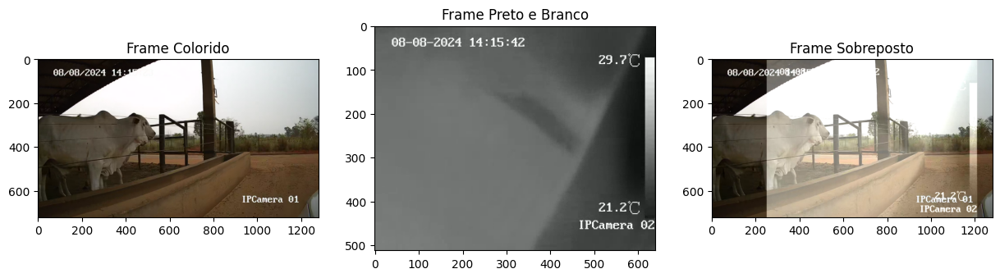

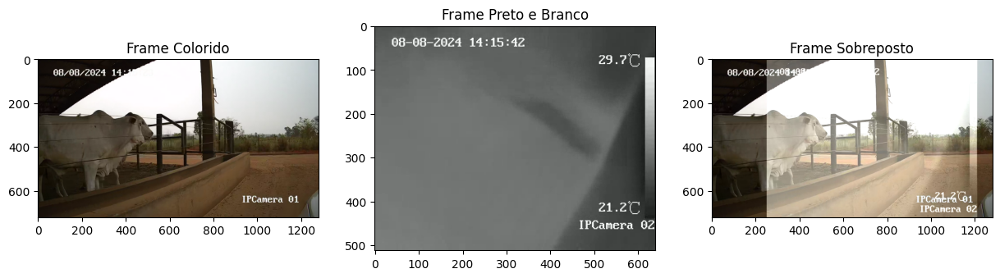

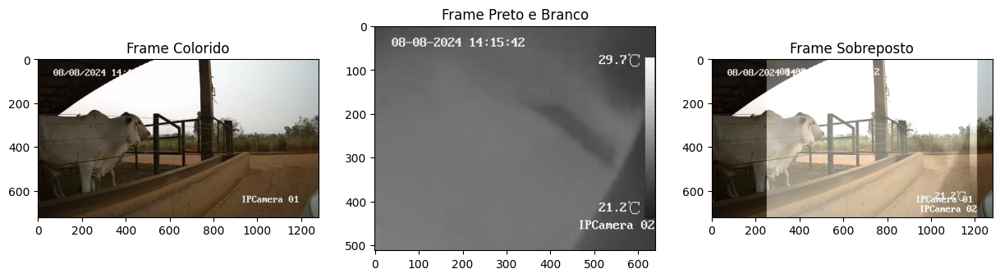

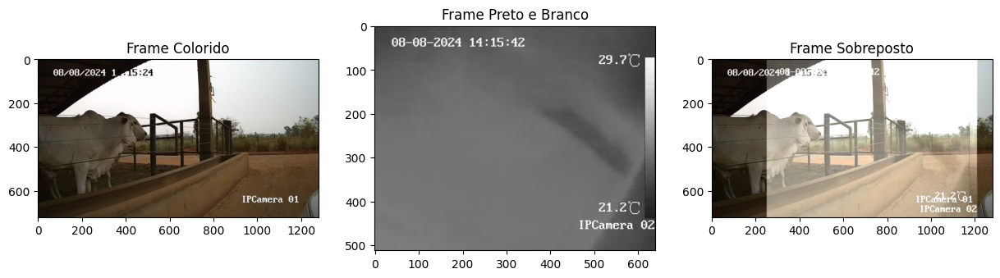

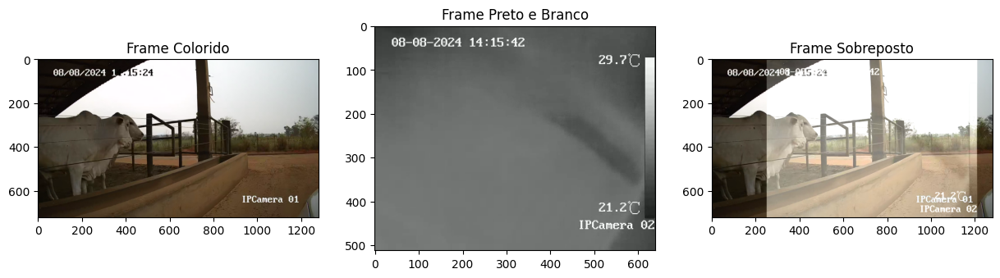

...

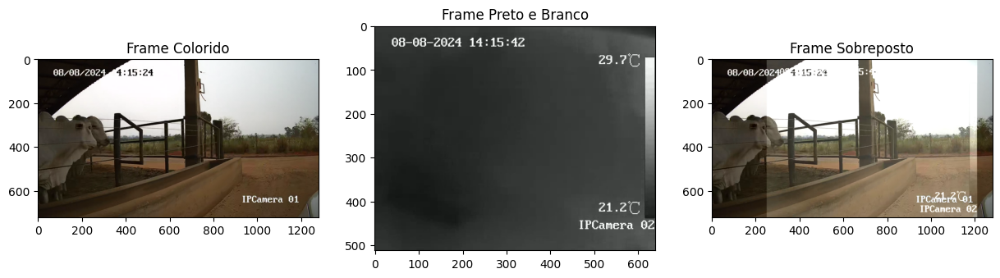

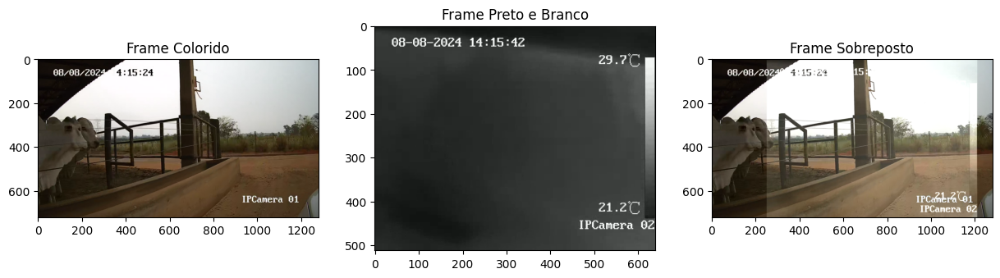

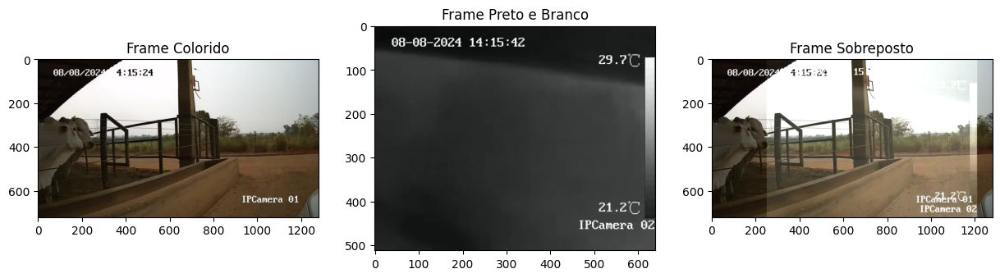

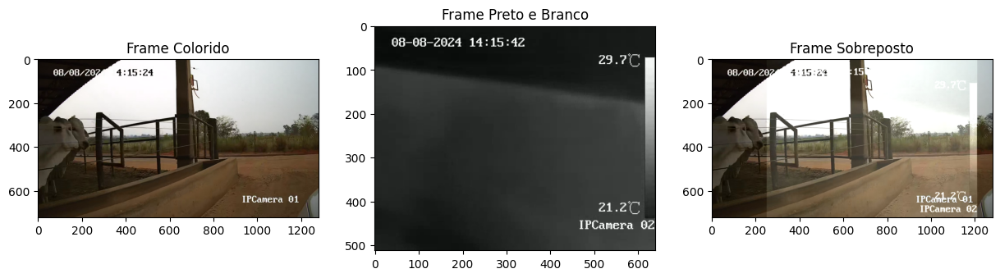

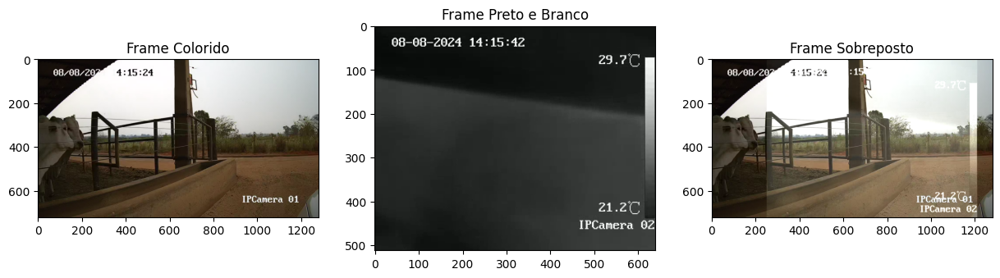

In [7]:
# Configurações de sobreposição
x, y = 250, 0  # Posição da sobreposição
opacidade = 1  # Nível de transparência
rotacao = 0  # Rotação em graus
resize_factor = 1.5  # Redimensionar o frame preto e branco (80% do original)

# Sobrepor frames e plotar 3 exemplos para ver o resultado
for i in range(11180, 11197):  # Plotar 3 frames para comparação
    frame_colorido = frames_reduzidos_colorido[i]
    frame_preto_branco = frames_preto_branco[i]

    # Sobrepor os frames
    frame_sobreposto = sobrepor_frames(frame_colorido, frame_preto_branco, x, y, opacidade, rotacao, resize_factor)

    # Plotar os 3 frames (colorido, preto e branco, sobreposto)
    plotar_comparacao(frame_colorido, frame_preto_branco, frame_sobreposto)



In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Função para extrair frames com seus timestamps
def extrair_frames_com_timestamps(path):
    cap = cv2.VideoCapture(path)

    if not cap.isOpened():
        print(f"Erro ao abrir o vídeo: {path}")
        return [], []

    frames = []
    timestamps = []
    frame_count = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        # Extrair o timestamp do frame em milissegundos
        timestamp = cap.get(cv2.CAP_PROP_POS_MSEC)
        frames.append(frame)
        timestamps.append(timestamp)
        frame_count += 1

    cap.release()

    return frames, timestamps

# Função para alinhar frames com base nos timestamps
def alinhar_frames_por_timestamps(frames_colorido, timestamps_colorido, frames_preto_branco, timestamps_preto_branco):
    frames_alinhados_colorido = []
    frames_alinhados_preto_branco = []

    idx_preto_branco = 0

    for idx_colorido in range(len(frames_colorido)):
        timestamp_colorido = timestamps_colorido[idx_colorido]

        # Encontrar o frame de preto e branco mais próximo em tempo do frame colorido
        while idx_preto_branco < len(timestamps_preto_branco) - 1 and timestamps_preto_branco[idx_preto_branco] < timestamp_colorido:
            idx_preto_branco += 1

        frames_alinhados_colorido.append(frames_colorido[idx_colorido])
        frames_alinhados_preto_branco.append(frames_preto_branco[idx_preto_branco])

    return frames_alinhados_colorido, frames_alinhados_preto_branco

# Caminhos dos vídeos
video_colorido_path = '/content/drive/MyDrive/approach_nwot/DATA/08-08/00000000217000400.mp4'
video_preto_branco_path = '/content/drive/MyDrive/approach_nwot/preto_branco_cortado.mp4'

# Extrair todos os frames e seus timestamps
frames_colorido, timestamps_colorido = extrair_frames_com_timestamps(video_colorido_path)
frames_preto_branco, timestamps_preto_branco = extrair_frames_com_timestamps(video_preto_branco_path)

# Alinhar os frames com base nos timestamps
frames_alinhados_colorido, frames_alinhados_preto_branco = alinhar_frames_por_timestamps(frames_colorido, timestamps_colorido, frames_preto_branco, timestamps_preto_branco)

# Configurações de sobreposição
x, y = 250, 0  # Posição da sobreposição
opacidade = 1  # Nível de transparência
rotacao = 0  # Rotação em graus
resize_factor = 1.5  # Redimensionar o frame preto e branco (80% do original)



Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_0.png


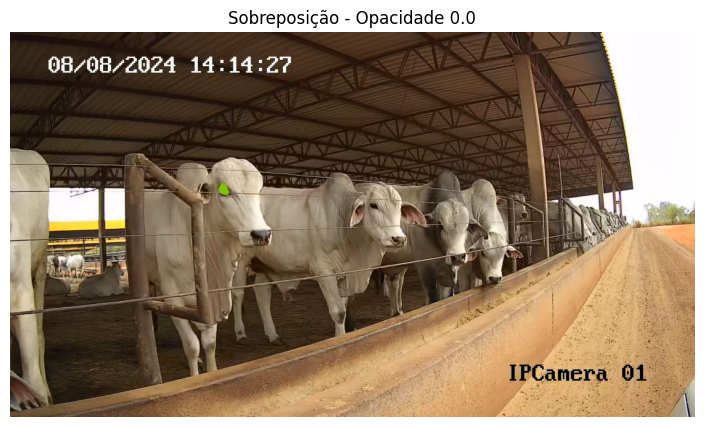

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_1.png


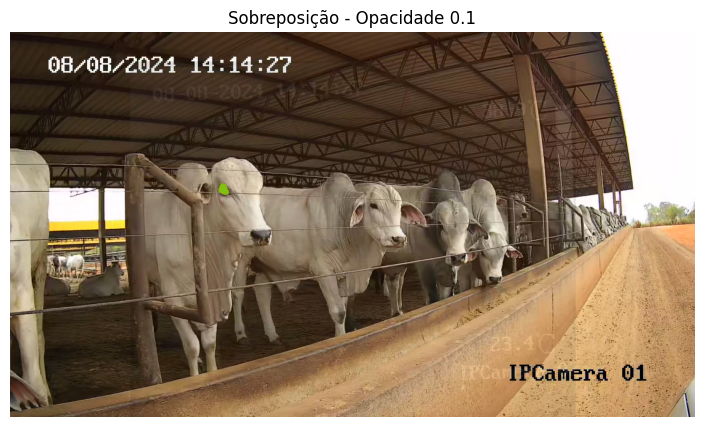

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_2.png


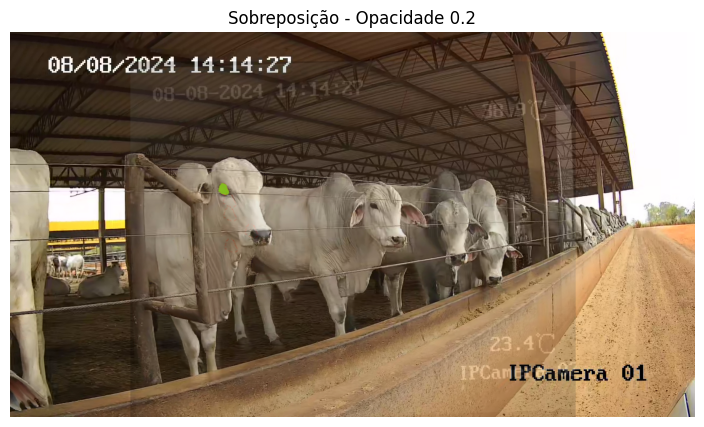

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_3.png


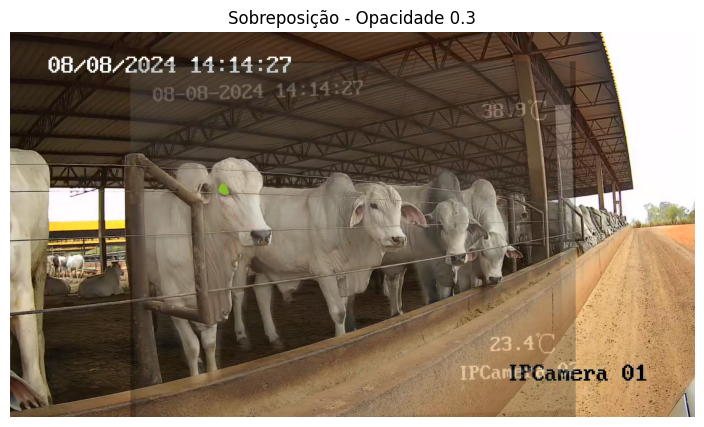

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_4.png


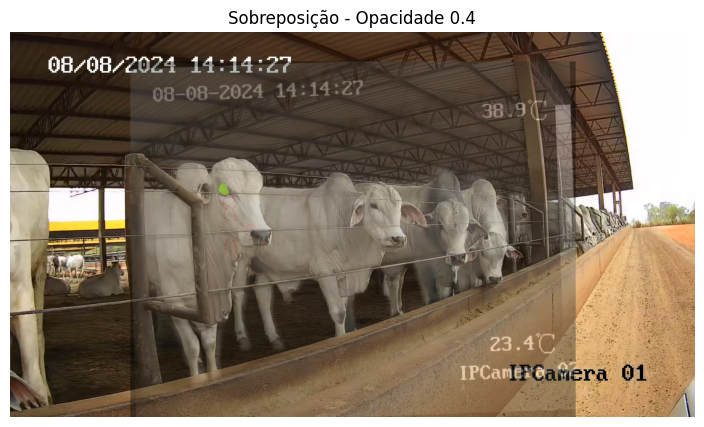

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_5.png


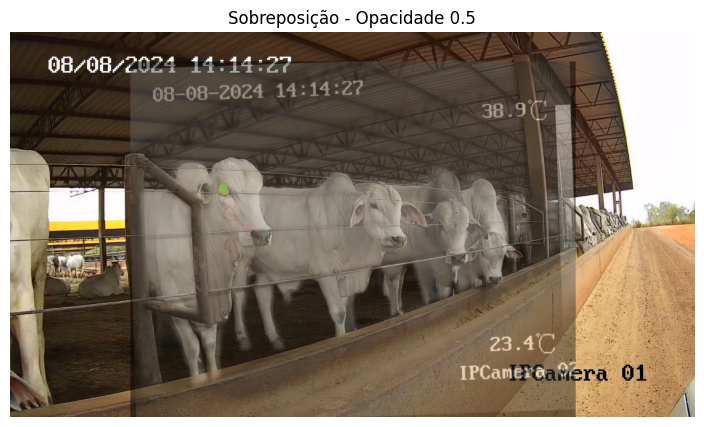

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_6.png


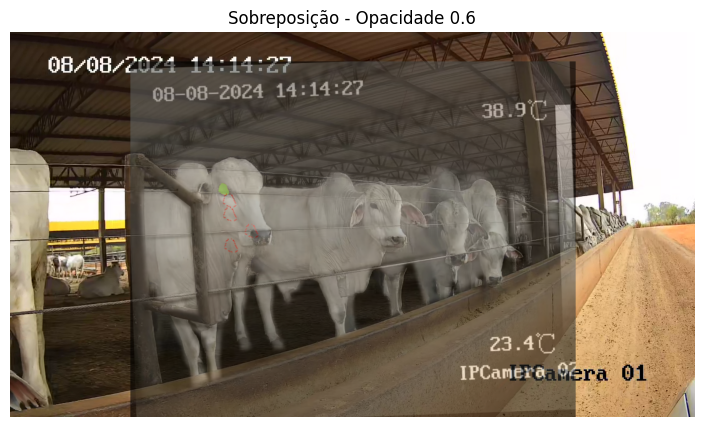

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_7.png


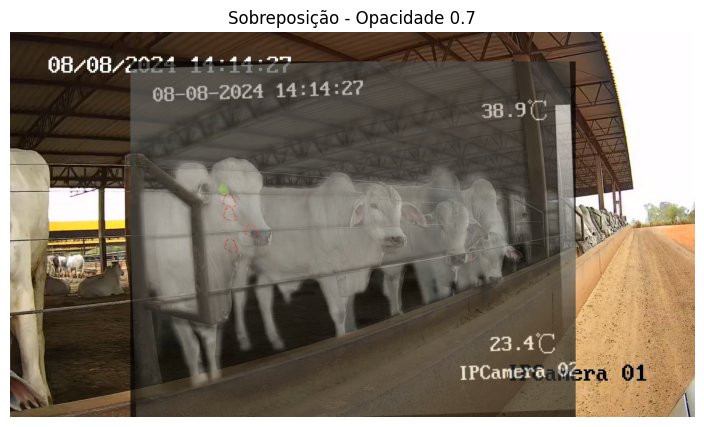

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_8.png


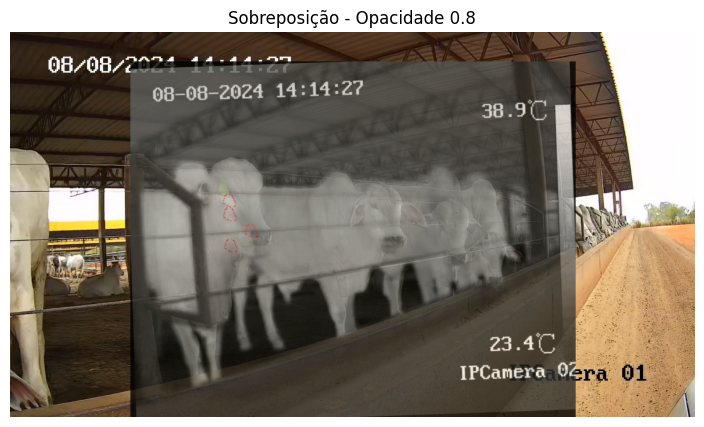

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_9.png


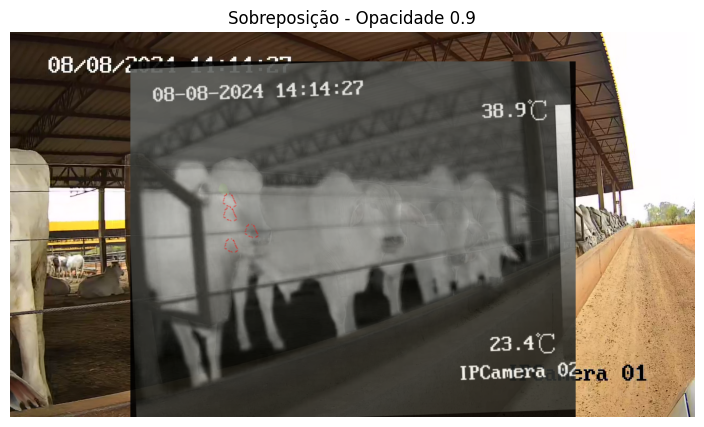

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_10.png


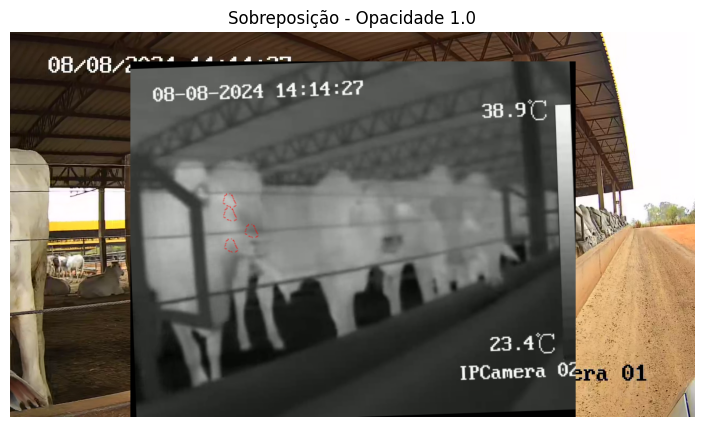

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_11.png


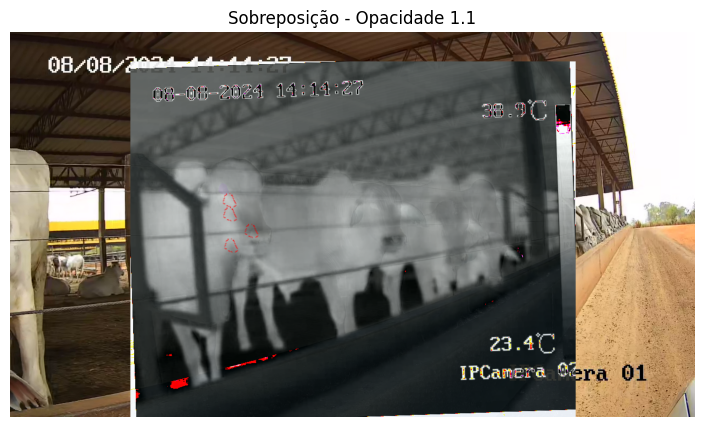

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_12.png


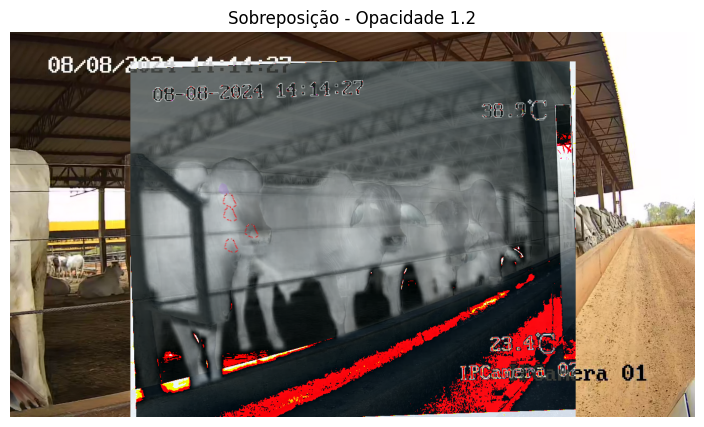

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_13.png


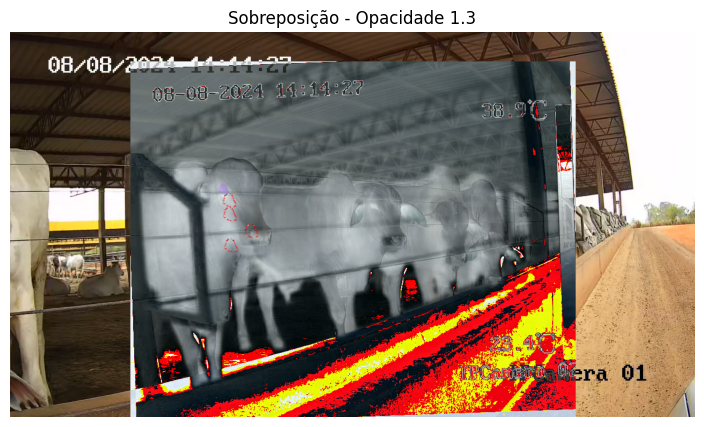

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_14.png


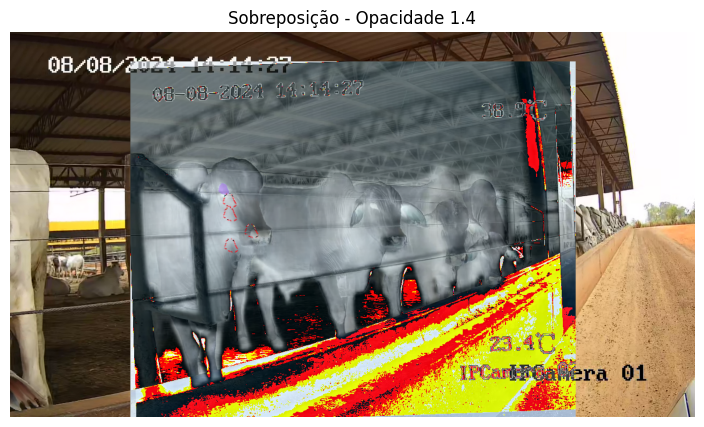

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_15.png


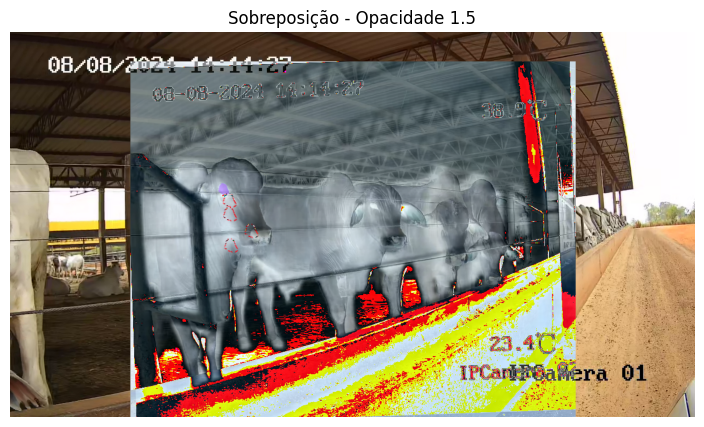

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_16.png


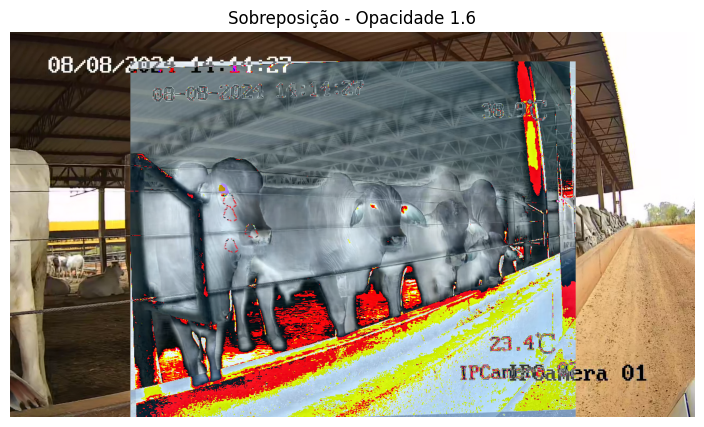

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_17.png


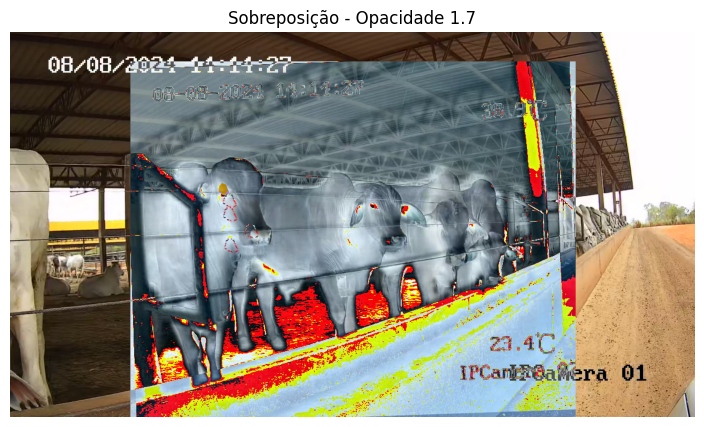

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_18.png


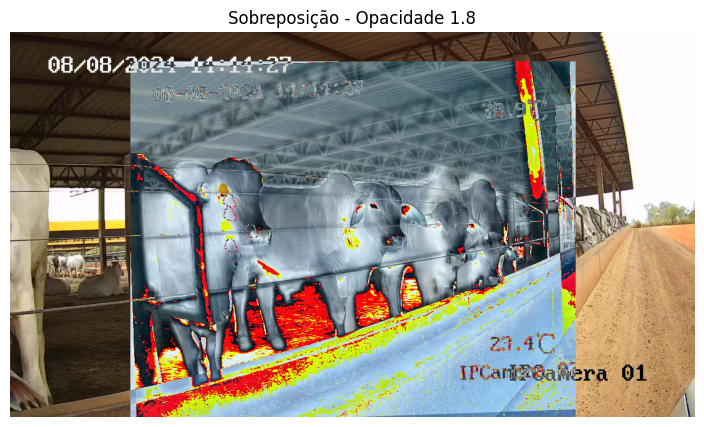

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_19.png


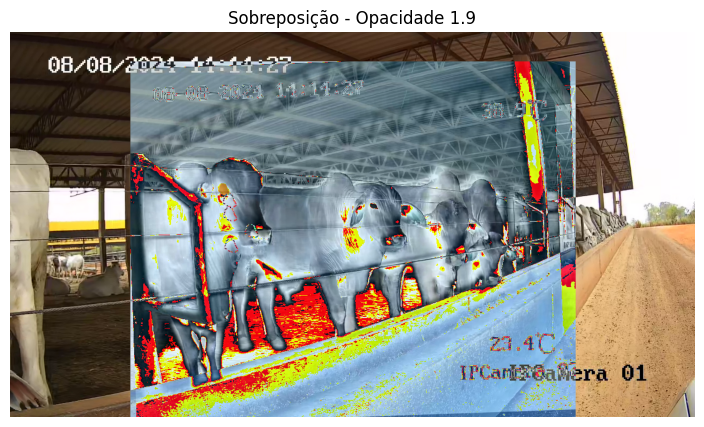

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_20.png


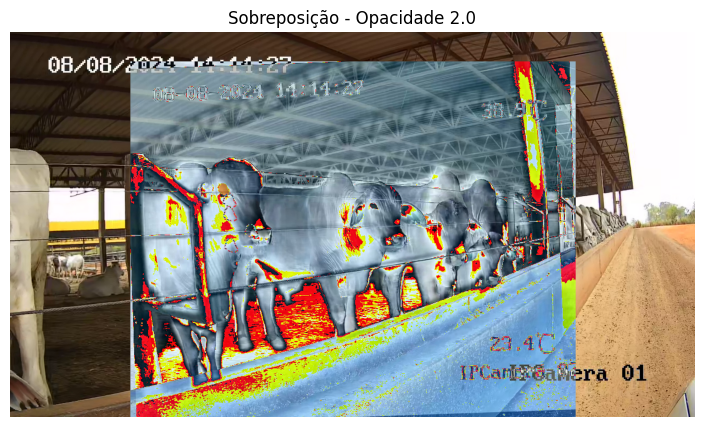

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_21.png


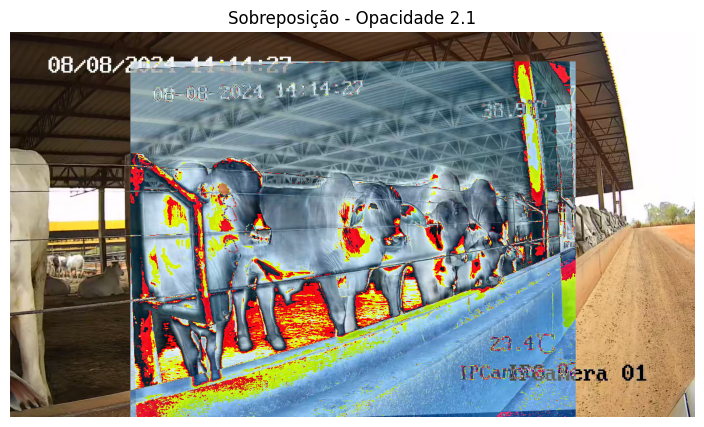

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_22.png


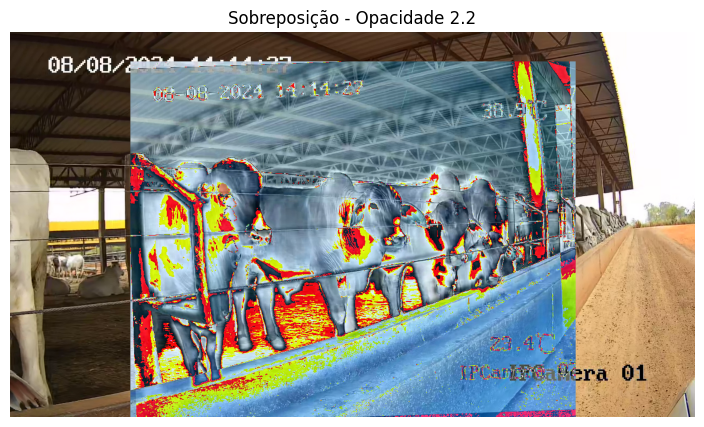

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_23.png


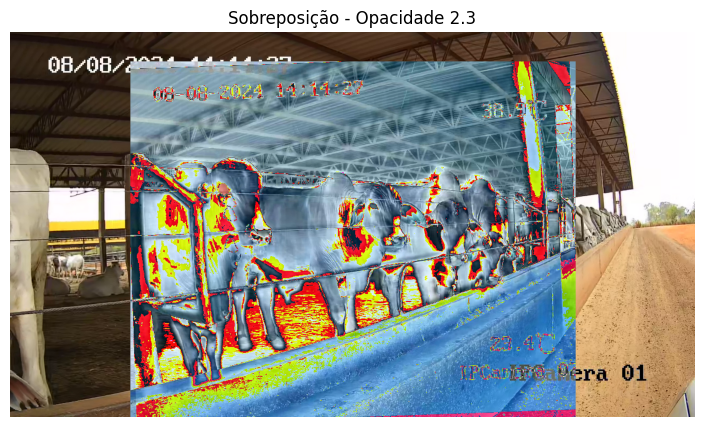

Frame salvo em /content/drive/MyDrive/approach_nwot/teste/frame_sobreposto_opacidade_24.png


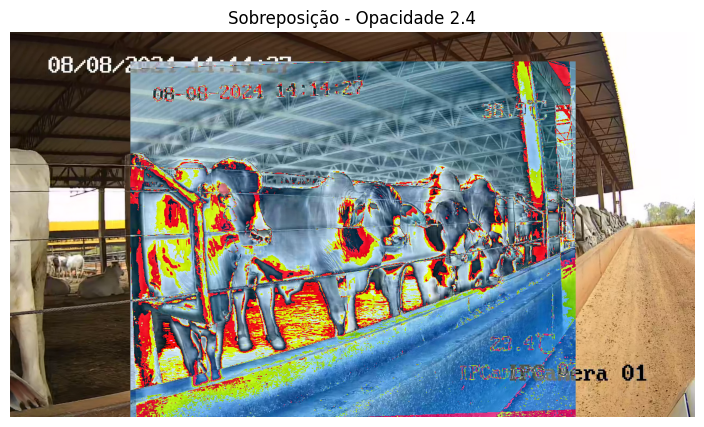

In [35]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Função para sobrepor os frames com opacidade ajustada
def sobrepor_frames(frame_colorido, frame_preto_branco, x, y, opacidade, rotacao, resize_factor):
    # Redimensionar o frame preto e branco
    height, width = frame_preto_branco.shape[:2]
    frame_preto_branco_resized = cv2.resize(frame_preto_branco, (int(width * resize_factor), int(height * resize_factor)))

    # Rotacionar o frame preto e branco
    center = (frame_preto_branco_resized.shape[1] // 2, frame_preto_branco_resized.shape[0] // 2)
    M = cv2.getRotationMatrix2D(center, rotacao, 1)
    frame_preto_branco_rotated = cv2.warpAffine(frame_preto_branco_resized, M, (frame_preto_branco_resized.shape[1], frame_preto_branco_resized.shape[0]))

    # Criar uma máscara para o frame preto e branco
    mask = np.zeros_like(frame_colorido, dtype=np.float32)
    mask[y:y + frame_preto_branco_rotated.shape[0], x:x + frame_preto_branco_rotated.shape[1]] = frame_preto_branco_rotated / 255.0

    # Aplicar a sobreposição com transparência
    frame_sobreposto = frame_colorido.astype(np.float32) / 255.0
    frame_sobreposto[y:y + frame_preto_branco_rotated.shape[0], x:x + frame_preto_branco_rotated.shape[1]] = (
        frame_sobreposto[y:y + frame_preto_branco_rotated.shape[0], x:x + frame_preto_branco_rotated.shape[1]] * (1 - opacidade) +
        mask[y:y + frame_preto_branco_rotated.shape[0], x:x + frame_preto_branco_rotated.shape[1]] * opacidade
    )

    return (frame_sobreposto * 255).astype(np.uint8)

# Função para salvar o frame como imagem
def salvar_frame(frame, path):
    cv2.imwrite(path, frame)
    print(f"Frame salvo em {path}")

# Caminho para salvar os resultados
output_dir = '/content/drive/MyDrive/approach_nwot/teste'

# Certifique-se de que o diretório exista
import os
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Configurações de sobreposição
x, y = 225, 55  # Posição da sobreposição
rotacao = 2  # Rotação em graus
resize_factor = 1.3  # Redimensionar o frame preto e branco (80% do original)

num = 11195  # Número do frame para comparar

for j in range(14):  # Loop para gerar diferentes sobreposições com opacidade variando de 0 a 2.5
    opacidade = j * 0.1  # Variar opacidade de 0 a 1

    # Extrair os frames específicos
    frame_colorido = frames_alinhados_colorido[num + 14]
    frame_comparacao_path = '/content/frame_comparacao.png'
    frame_colorido = cv2.imread(frame_comparacao_path)

    frame_preto_branco = frame_preto_branco_pintado

    # Sobrepor os frames com a opacidade atual
    frame_sobreposto = sobrepor_frames(frame_colorido, frame_preto_branco, x, y, opacidade, rotacao, resize_factor)

    # Salvar o frame sobreposto
    salvar_frame(frame_sobreposto, f'{output_dir}/frame_sobreposto_opacidade_{j}.png')

    # Plotar o frame sobreposto com a opacidade
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(frame_sobreposto, cv2.COLOR_BGR2RGB))
    plt.title(f'Sobreposição - Opacidade {opacidade:.1f}')
    plt.axis('off')
    plt.show()


In [61]:
from google.colab import files
import cv2

# Função para salvar o frame como imagem
def salvar_frame(frame, path):
    cv2.imwrite(path, frame)
    print(f"Frame salvo em {path}")

# Exemplo de uso com o frame 'frames_alinhados_colorido[num+14]'
num = 11195
frame_colorido = frames_alinhados_colorido[num + 630]

# Caminho para salvar o frame
output_frame_path = '/content/frame_colorido.png'

# Salvar o frame
salvar_frame(frame_colorido, output_frame_path)

# Baixar o frame
files.download(output_frame_path)


Frame salvo em /content/frame_colorido.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

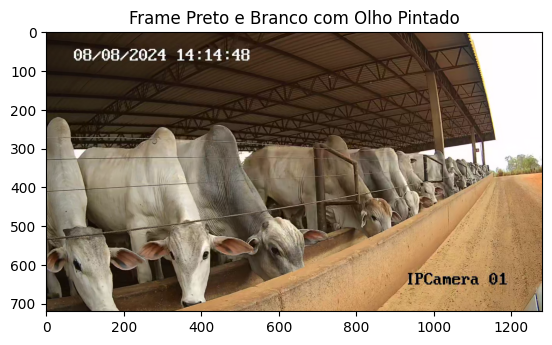

In [64]:
frame_colorido = frames_alinhados_colorido[num + 630]
plt.subplot(1, 1, 1)
plt.imshow(cv2.cvtColor(frame_colorido, cv2.COLOR_BGR2RGB))
plt.title('Frame Preto e Branco com Olho Pintado')

plt.show()


In [ ]:
frame_comparacao_path = '/content/frame_comparacao.png'
frame_colorido = cv2.imread(frame_comparacao_path)

frame_preto_branco = frames_alinhados_preto_branco[num]  # Suponho que já tenha sido carregado anteriormente


Contornos encontrados no frame 1: 1
Contornos encontrados no frame 2: 1
Contornos encontrados no frame 3: 2


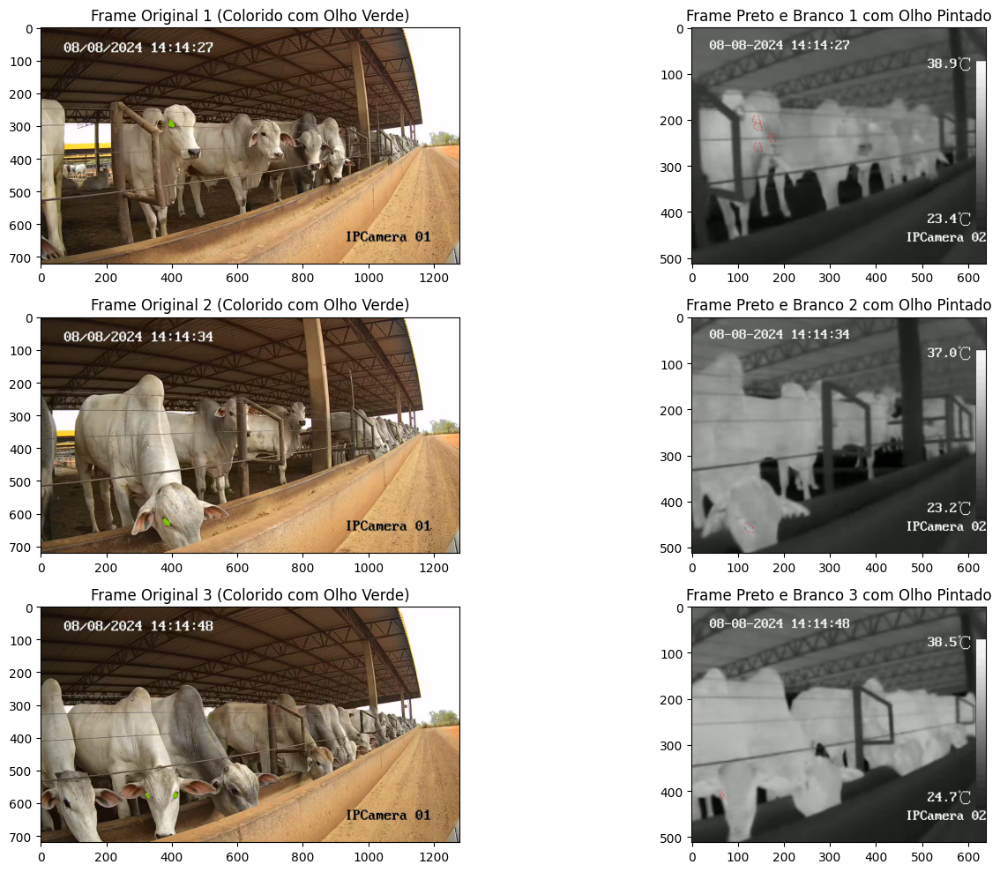

In [196]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Função para encontrar o contorno verde no frame colorido
def encontrar_contorno_verde(frame_colorido):
    # Converter o frame colorido para o espaço de cor HSV
    hsv = cv2.cvtColor(frame_colorido, cv2.COLOR_BGR2HSV)

    # Definir o intervalo para a cor verde claro (em HSV)
    lower_verde = np.array([40, 40, 40])   # Limite inferior
    upper_verde = np.array([80, 255, 255])  # Limite superior

    # Criar uma máscara para o verde
    mask = cv2.inRange(hsv, lower_verde, upper_verde)

    # Encontrar contornos na máscara
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Filtrar os contornos pequenos
    contornos_verdes = [c for c in contours if cv2.contourArea(c) > 50]

    return contornos_verdes

# Função para aplicar o contorno modificado na imagem preto e branco
def aplicar_contorno_preto_branco(img_preto_branco, contours, x_shift, y_shift):
    # Verificar o número de canais da imagem
    if len(img_preto_branco.shape) == 2:
        # Converter a imagem preto e branco para RGB para permitir a cor vermelha
        img_preto_branco_rgb = cv2.cvtColor(img_preto_branco, cv2.COLOR_GRAY2RGB)
    else:
        img_preto_branco_rgb = img_preto_branco  # A imagem já está em RGB

    if len(contours) == 0:
        print("Nenhum contorno encontrado para a aplicação.")
        return img_preto_branco_rgb  # Retorna a imagem sem mudanças

    # Transladar os contornos para a posição correta
    for contour in contours[0]:
        if contour.shape[1] != 2:
            print(f"Contorno com formato inesperado: {contour.shape}")
            continue  # Ignorar contornos com o formato errado

        # Verificar se o primeiro do contourno Y é maior que 300
        contour_shifted = contour.astype(np.float32)

        if contour[0][1] > 400:
          x_shift, y_shift = 52, 130
          contour_shifted[:, 0] -= x_shift * 5  # Diminuir X
          contour_shifted[:, 1] -= y_shift * 1.3 # Diminuir Y
        else:
          x_shift, y_shift = 215, 85
          contour_shifted[:, 0] -= x_shift * 1.2  # Diminuir X
          contour_shifted[:, 1] -= y_shift * 1.1 # Diminuir Y


        # Diminuir X e Y conforme especificado
        # print(f"Contorno original: {contour_shifted}")


        # Countorno alterado:
        # print(f"Contorno alterado do frame: {contour_shifted}")

        # Desenhar o contorno na imagem preto e branco (pintando de vermelho)
        cv2.drawContours(img_preto_branco_rgb, [contour_shifted.astype(int)], -1, (0, 0, 255), thickness=-1)

    return img_preto_branco_rgb

# Caminhos para os frames de comparação
frame_comparacao_paths = [
    '/content/frame_comparacao.png',   # Primeiro arquivo
    '/content/frame_comparacao2.png',  # Segundo arquivo
    '/content/frame_comparacao3.png'   # Terceiro arquivo
]

# Frames preto e branco correspondentes
frames_preto_branco = [
    frames_alinhados_preto_branco[num].copy(),
    frames_alinhados_preto_branco[num + 220].copy(),
    frames_alinhados_preto_branco[num + 620].copy()
]

# Shift de X e Y - todos iguais
x_shift, y_shift = 255, 130

# Carregar os frames de comparação e processar
plt.figure(figsize=(15, 10))
for i, (frame_comparacao_path, frame_preto_branco) in enumerate(zip(frame_comparacao_paths, frames_preto_branco)):
    frame_comparacao = cv2.imread(frame_comparacao_path)

    if frame_comparacao is None:
        print(f"Erro: Frame de comparação {i + 1} não encontrado. Verifique o caminho.")
        continue

    # Encontrar o contorno verde no frame de comparação
    contornos_verdes = encontrar_contorno_verde(frame_comparacao)

    if len(contornos_verdes) == 0:
        print(f"Erro: Nenhum contorno verde encontrado no frame {i + 1}")
    else:
        print(f"Contornos encontrados no frame {i + 1}: {len(contornos_verdes)}")

    # Aplicar o contorno modificado na imagem preto e branco
    frame_preto_branco_pintado = aplicar_contorno_preto_branco(frame_preto_branco, contornos_verdes, x_shift, y_shift)

    # Plotar as imagens lado a lado
    plt.subplot(3, 2, i * 2 + 1)
    plt.imshow(cv2.cvtColor(frame_comparacao, cv2.COLOR_BGR2RGB))
    plt.title(f'Frame Original {i + 1} (Colorido com Olho Verde)')

    plt.subplot(3, 2, i * 2 + 2)
    plt.imshow(cv2.cvtColor(frame_preto_branco_pintado, cv2.COLOR_BGR2RGB))
    plt.title(f'Frame Preto e Branco {i + 1} com Olho Pintado')

plt.tight_layout()
plt.show()
